# Group 9 Final Project ---- Flight Delays ✈️ ⏰ ⏳


### Team Members: 
### Antara Joshi
### Prasad Patil
### Ching Yu Hsu
## Project Introduction
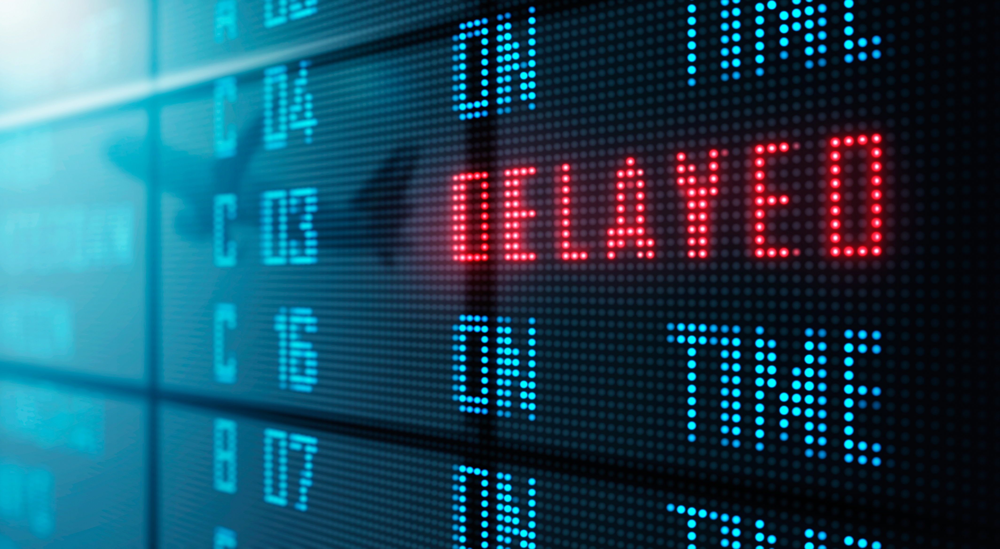
Flight delays are one of the most common issues in air travel, affecting both passengers and airline operations. 
This project aims to analyze patterns and potential causes of flight delays using the datasets with flight performance, weather, and temperature data.


### Research Questions

The **unit of analysis** in this project aims to answer the following key questions:

1. Which carriers have the highest average delay per flight? 
2. Do warmer months show more average delays?
3. Does temperature correlate with delay per flight?


### Data Sources
- Airline Delay Cause (structured: CSV format)
- City Temperature (structured: CSV format)


### Objective
To identify key patterns and potential causes of flight delays using Python-based data analysis. 
The insights from this analysis can help us better understand how environmental and operational factors contribute to flight disruptions, and potentially guide improvements in airline planning and passenger communication.


### Tools and Methods
- Python libraries: pandas, numpy, matplotlib/seaborn, possibly sklearn for modeling
- Data cleaning and preprocessing
- Descriptive analysis and visualizations
- Optional: regression or classification models for delay prediction


1. Loading dataset then merging two datasets and dropping NA and null values , columns not required .
2.Feature engineering and plotting scatter matrix
3.Analyzing trend answering research questions
4.Building different ML models



In [ ]:
# Generic inputs for most ML tasks
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn import tree
import graphviz
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier

pd.options.display.float_format = '{:,.2f}'.format

# setup interactive notebook mode
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
from IPython.display import display, HTML

Loading first dataset.


In [2]:
# Load the dataset
data = pd.read_csv('Airline_Delay_Cause.csv')

# Drop missing values and create a clean copy
data_cleaned = data.dropna().copy()

# Extract the city name before the colon in 'airport_name'
data_cleaned.loc[:, 'City'] = data_cleaned['airport_name'].str.extract(r'^(.*?):')
data_cleaned.loc[:, 'City'] = data_cleaned['City'].str.split(',').str[0].str.strip()

# Removing all the blank spaces and special characters from title column.
data_cleaned.loc[:, 'City'] = data_cleaned['City'].str.lower().str.replace(' ', '', regex=False)
data_cleaned.loc[:, 'City'] = data_cleaned['City'].str.replace(r'[^a-zA-Z0-9\s]', '', regex=True)

# Display basic information
print(data_cleaned.info())

<class 'pandas.core.frame.DataFrame'>
Index: 171223 entries, 0 to 171665
Data columns (total 22 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   year                 171223 non-null  int64  
 1   month                171223 non-null  int64  
 2   carrier              171223 non-null  object 
 3   carrier_name         171223 non-null  object 
 4   airport              171223 non-null  object 
 5   airport_name         171223 non-null  object 
 6   arr_flights          171223 non-null  float64
 7   arr_del15            171223 non-null  float64
 8   carrier_ct           171223 non-null  float64
 9   weather_ct           171223 non-null  float64
 10  nas_ct               171223 non-null  float64
 11  security_ct          171223 non-null  float64
 12  late_aircraft_ct     171223 non-null  float64
 13  arr_cancelled        171223 non-null  float64
 14  arr_diverted         171223 non-null  float64
 15  arr_delay            1

Loading second dataset

In [3]:
# Load the dataset
weather = pd.read_csv('city_temperature.csv', dtype={'City': str, 'State': str})

weather_cleaned = weather.dropna().copy()

# Standardize column names
weather_cleaned.rename(columns={'Month': 'month', 'Year': 'year'}, inplace=True)

# Removing all the blank spaces and special characters from title column.
weather_cleaned.loc[:, 'City'] = weather_cleaned['City'].str.lower().str.replace(' ', '', regex=False)
weather_cleaned.loc[:, 'City'] = weather_cleaned['City'].str.replace(r'[^a-zA-Z0-9\s]', '', regex=True)

# Display basic information
print(weather_cleaned.info())

<class 'pandas.core.frame.DataFrame'>
Index: 1455337 entries, 1450990 to 2906326
Data columns (total 8 columns):
 #   Column          Non-Null Count    Dtype  
---  ------          --------------    -----  
 0   Region          1455337 non-null  object 
 1   Country         1455337 non-null  object 
 2   State           1455337 non-null  object 
 3   City            1455337 non-null  object 
 4   month           1455337 non-null  int64  
 5   Day             1455337 non-null  int64  
 6   year            1455337 non-null  int64  
 7   AvgTemperature  1455337 non-null  float64
dtypes: float64(1), int64(3), object(4)
memory usage: 99.9+ MB
None


Merging two dataframes

In [4]:
# Merging the columns
merged_df = pd.merge(data_cleaned, weather_cleaned, how='inner', on=['City', 'month', 'year'])
print(merged_df.head())

# Converting the merged dataframe to csv file.
merged_df.to_csv("merged_airline_weather_data.csv", index=False)


   year  month carrier       carrier_name airport  \
0  2020      5      9E  Endeavor Air Inc.     ABY   
1  2020      5      9E  Endeavor Air Inc.     ABY   
2  2020      5      9E  Endeavor Air Inc.     ABY   
3  2020      5      9E  Endeavor Air Inc.     ABY   
4  2020      5      9E  Endeavor Air Inc.     ABY   

                             airport_name  arr_flights  arr_del15  carrier_ct  \
0  Albany, GA: Southwest Georgia Regional        25.00       2.00        0.00   
1  Albany, GA: Southwest Georgia Regional        25.00       2.00        0.00   
2  Albany, GA: Southwest Georgia Regional        25.00       2.00        0.00   
3  Albany, GA: Southwest Georgia Regional        25.00       2.00        0.00   
4  Albany, GA: Southwest Georgia Regional        25.00       2.00        0.00   

   weather_ct  ...  weather_delay  nas_delay  security_delay  \
0        0.00  ...           0.00      97.00            0.00   
1        0.00  ...           0.00      97.00            0.00   
2 

Text(0.5, 1.02, 'Scatter Matrix of Numerical Features')

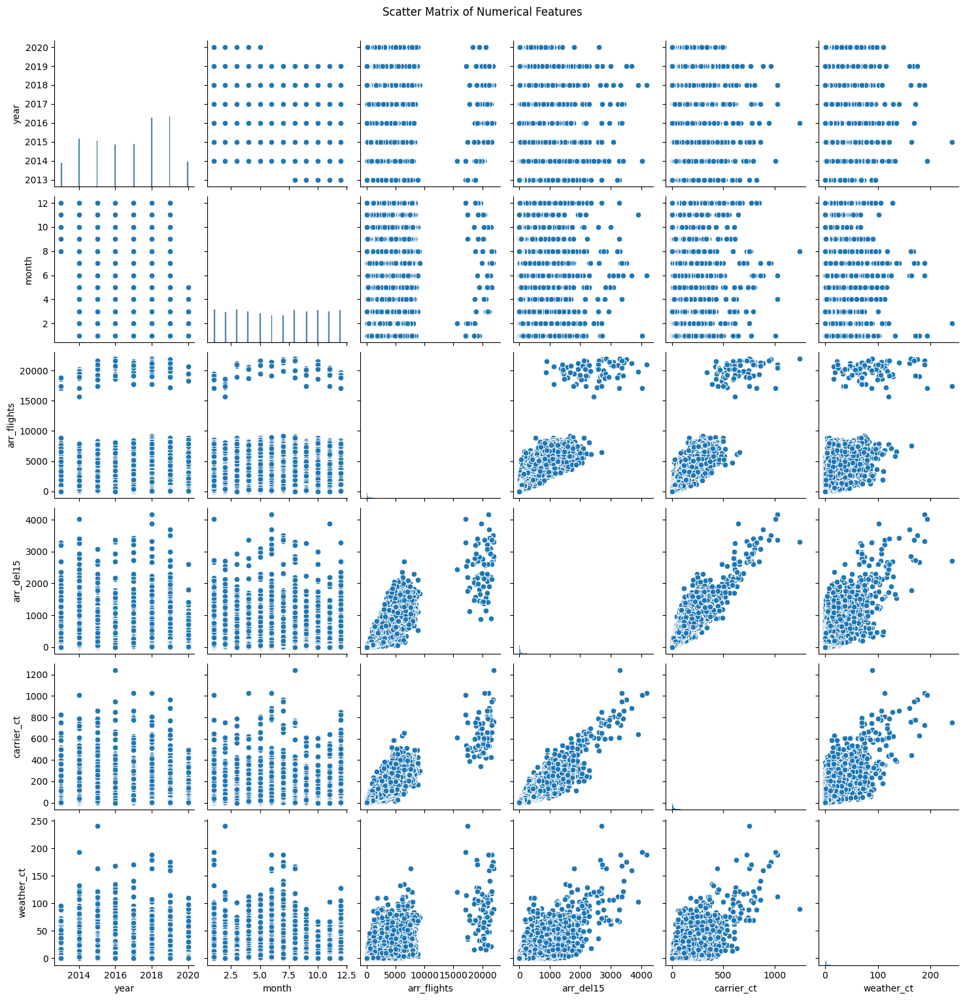

In [5]:

# Load your data
merged_df = pd.read_csv("merged_airline_weather_data.csv")

# Clean column names
merged_df.columns = merged_df.columns.str.strip().str.lower()

# Drop rows with missing values in key columns
filtered_df = merged_df.dropna(subset=['weather_delay', 'avgtemperature'])

# Select numerical columns only
numeric_cols = filtered_df.select_dtypes(include='number')

# Take the first 6 for clear visualization
selected_cols = numeric_cols.iloc[:, :6]

# Plot scatter matrix
sns.pairplot(selected_cols)
plt.suptitle("Scatter Matrix of Numerical Features", y=1.02)
plt.show()


From the scatter matrix analysis, the variable most strongly associated with arrival delays is carrier_ct, suggesting that carrier-related issues are the leading cause of delays. While weather-related delays (weather_ct) also contribute, their effect is comparatively smaller. Additionally, airports handling more flights (arr_flights) tend to have higher delays, likely due to congestion.

### ✈️ Exploring Correlations Among Flight Delay Factors ✈️

Delays rarely depend on temperature alone — for most cities, weather‑related delays stay under ~400 min across the full temperature range.

Huge spikes (1 000–3 000 min) in cities like Chicago and Atlanta are outliers, probably tied to severe storms or airport shutdowns; these should be isolated for separate investigation.

No consistent upward or downward trend suggests we need richer weather features (precipitation, snow, wind) to explain big delays.

In [ ]:

# -------------------------------------------------------------
# 1. Make sure required libraries are available
# -------------------------------------------------------------
import sys, subprocess, pkg_resources

def pip_install(pkg_spec):
    """Install a package inside the notebook/kernel if not present."""
    subprocess.check_call([sys.executable, "-m", "pip", "install", "--quiet", pkg_spec])

for pkg in ("pandas", "bokeh>=3"):
    try:
        pkg_resources.get_distribution(pkg.split(">=")[0])
    except pkg_resources.DistributionNotFound:
        pip_install(pkg)

# -------------------------------------------------------------
# 2. Imports
# -------------------------------------------------------------
import pandas as pd
from bokeh.io import output_notebook, show
from bokeh.plotting import figure
from bokeh.palettes import Category10

output_notebook()          # embed Bokeh plots in Jupyter / Colab

# -------------------------------------------------------------
# 3. Data prep
# -------------------------------------------------------------
merged_df.columns = merged_df.columns.str.strip().str.lower()

city_col  = "city"
temp_col  = "avgtemperature"
delay_col = "weather_delay"

# Top-10 cities by row count
top_cities = merged_df[city_col].value_counts().nlargest(10).index
filtered   = merged_df[merged_df[city_col].isin(top_cities)]

# Mean delay at each (city, temperature) point
smoothed = (
    filtered
    .groupby([city_col, temp_col], as_index=False)[delay_col]
    .mean()
    .sort_values(temp_col)
)

# -------------------------------------------------------------
# 4. Interactive line chart
# -------------------------------------------------------------
palette = Category10[10]
p = figure(
    title="Weather Delay vs. Average Temperature — Top 10 Cities",
    x_axis_label="Average Temperature (°F)",
    y_axis_label="Weather Delay (minutes)",
    width=800, height=450,
    tools="pan,wheel_zoom,box_zoom,reset,save,hover",
    active_drag="pan",
)

for i, city in enumerate(top_cities):
    city_df = smoothed[smoothed[city_col] == city]
    p.line(
        x=city_df[temp_col],
        y=city_df[delay_col],
        legend_label=city.title(),
        line_width=2,
        color=palette[i % len(palette)],
        alpha=0.8,
    )

p.legend.location = "top_right"
p.legend.click_policy = "hide"   # click legend entries to toggle visibility

show(p)



pandas 2.2.3 (/Users/prasadpatil/Library/Python/3.9/lib/python/site-packages)

bokeh 3.4.3 (/Users/prasadpatil/Library/Python/3.9/lib/python/site-packages)

Loading BokehJS ...

GlyphRenderer(id='p1040', ...)

GlyphRenderer(id='p1053', ...)

GlyphRenderer(id='p1065', ...)

GlyphRenderer(id='p1077', ...)

GlyphRenderer(id='p1089', ...)

GlyphRenderer(id='p1101', ...)

GlyphRenderer(id='p1113', ...)

GlyphRenderer(id='p1125', ...)

GlyphRenderer(id='p1137', ...)

GlyphRenderer(id='p1149', ...)

Detecting the outliers and then dropping them.

In [ ]:

# Load your dataset
merged_df = pd.read_csv("merged_airline_weather_data.csv")
merged_df.columns = merged_df.columns.str.strip().str.lower()

# Identify numeric columns
numeric_columns = merged_df.select_dtypes(include='number').columns.tolist()

# Function to detect outliers using IQR
def detect_outliers_iqr(data, columns):
    outlier_summary = {}
    for col in columns:
        Q1 = data[col].quantile(0.25)
        Q3 = data[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers = data[(data[col] < lower_bound) | (data[col] > upper_bound)]
        outlier_summary[col] = len(outliers)
    return pd.DataFrame.from_dict(outlier_summary, orient='index', columns=['Outlier Count']).sort_values(by='Outlier Count', ascending=False)

# Run the function
outlier_counts = detect_outliers_iqr(merged_df, numeric_columns)

# Show top 10 columns with the most outliers
print(outlier_counts.head(10))


                     Outlier Count
nas_delay                   284590
arr_cancelled               282139
security_delay              281346
security_ct                 281130
late_aircraft_ct            278163
nas_ct                      277693
weather_delay               270470
arr_flights                 269618
late_aircraft_delay         268991
arr_del15                   264105


Finding shape and then cleaning and printing new shape


In [ ]:
# Define which columns to clean
columns_to_clean = ['weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay']

# Define the outlier removal function
def remove_selected_outliers(df, cols):
    for col in cols:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - 1.5 * IQR
        upper = Q3 + 1.5 * IQR
        df = df[(df[col] >= lower) & (df[col] <= upper)]
    return df

# Apply it to the dataset
df_cleaned = remove_selected_outliers(merged_df, columns_to_clean)

# Check new shape or preview cleaned data
print("Original shape:", merged_df.shape)
print("Cleaned shape:", df_cleaned.shape)
df_cleaned.head()


Original shape: (2165420, 27)
Cleaned shape: (1474938, 27)


,year,month,carrier,carrier_name,airport,airport_name,arr_flights,arr_del15,carrier_ct,weather_ct,...,weather_delay,nas_delay,security_delay,late_aircraft_delay,city,region,country,state,day,avgtemperature
0,2020,5,9E,Endeavor Air Inc.,ABY,"Albany, GA: Southwest Georgia Regional",25.00,2.00,0.00,0.00,...,0.00,97.00,0.00,0.00,albany,North America,US,New York,1,57.80
1,2020,5,9E,Endeavor Air Inc.,ABY,"Albany, GA: Southwest Georgia Regional",25.00,2.00,0.00,0.00,...,0.00,97.00,0.00,0.00,albany,North America,US,New York,2,57.20
2,2020,5,9E,Endeavor Air Inc.,ABY,"Albany, GA: Southwest Georgia Regional",25.00,2.00,0.00,0.00,...,0.00,97.00,0.00,0.00,albany,North America,US,New York,3,66.20
3,2020,5,9E,Endeavor Air Inc.,ABY,"Albany, GA: Southwest Georgia Regional",25.00,2.00,0.00,0.00,...,0.00,97.00,0.00,0.00,albany,North America,US,New York,4,58.10
4,2020,5,9E,Endeavor Air Inc.,ABY,"Albany, GA: Southwest Georgia Regional",25.00,2.00,0.00,0.00,...,0.00,97.00,0.00,0.00,albany,North America,US,New York,5,48.00


We used feature engineering , found outliers and then went ahead and used important feature for engineering.

We found the important features , dropped outliers and then we went ahead an

In [1]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

df = pd.read_csv("merged_airline_weather_data.csv")
df.columns = df.columns.str.strip().str.lower()

# Remove outliers from selected columns
def remove_selected_outliers(df, cols):
    for col in cols:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - 1.5 * IQR
        upper = Q3 + 1.5 * IQR
        df = df[(df[col] >= lower) & (df[col] <= upper)]
    return df

columns_to_clean = ['weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay']
df_cleaned = remove_selected_outliers(df, columns_to_clean)

# plotting coorelation matrix
plt.figure(figsize=(12, 10))
corr = df_cleaned.select_dtypes(include='number').corr()
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Correlation Matrix - Cleaned Data")
plt.show()

target = 'weather_delay'
features = [col for col in df_cleaned.select_dtypes(include='number').columns if col != target]

X = df_cleaned[features]
y = df_cleaned[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# Calculate RMSE and R²
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f"RMSE: {rmse:.2f}")
print(f"R² Score: {r2:.2f}")

# ------------------------------
# Before vs After - weather_delay distribution
# ------------------------------
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.histplot(df['weather_delay'], bins=50, kde=True, color='red')
plt.title("Before Outlier Removal - weather_delay")

plt.subplot(1, 2, 2)
sns.histplot(df_cleaned['weather_delay'], bins=50, kde=True, color='green')
plt.title("After Outlier Removal - weather_delay")

plt.tight_layout()
plt.show()

# ------------------------------
# Feature Importance
# ------------------------------
importance = model.feature_importances_
sorted_idx = np.argsort(importance)[-10:]

plt.figure(figsize=(10, 6))
plt.barh(range(len(sorted_idx)), importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), [features[i] for i in sorted_idx])
plt.xlabel("Feature Importance")
plt.title("Top 10 Important Features Predicting Weather Delay")
plt.show()

# ------------------------------
# Actual vs Predicted Plot
# ------------------------------
plt.figure(figsize=(6, 6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.3)
plt.xlabel("Actual Weather Delay")
plt.ylabel("Predicted Weather Delay")
plt.title("Actual vs Predicted Weather Delay")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.tight_layout()
plt.show()


NameError: name 'pd' is not defined

High delays are driven chiefly by carrier, late-aircraft, and NAS issues (strongest correlations ≥ 0.9), rise with flight volume, are only moderately weather-related, and show little direct link to season or year.

Going ahead, let's answer second question

## Average Arrival Delay Per Flight by Carrier

<Figure size 1200x800 with 0 Axes>

/var/folders/17/93sqhz4n7qn3v270rmj1rsy00000gn/T/ipykernel_9847/1745236054.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


<Axes: xlabel='arr_delay', ylabel='carrier_name'>

Text(0.5, 1.0, 'Arrival-Delay Distribution by Carrier (≥500 flights)')

Text(0.5, 0, 'Arrival Delay (minutes)')

Text(0, 0.5, 'Carrier')

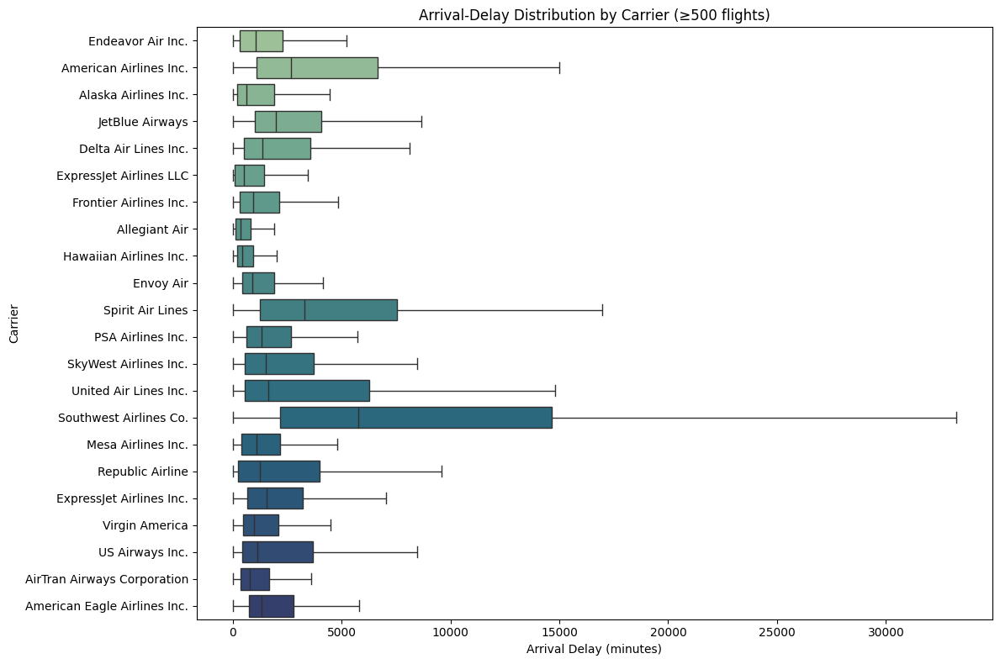

In [10]:

# ── pick carriers with at least 500 flights so the boxes are meaningful
min_flights = 500
big_carriers = (
    merged_df.groupby("carrier_name")["arr_flights"]
    .sum()
    .loc[lambda s: s >= min_flights]
    .index
)

box_df = merged_df[merged_df["carrier_name"].isin(big_carriers)]

plt.figure(figsize=(12, 8))
sns.boxplot(
    data=box_df,
    x="arr_delay",              # in minutes
    y="carrier_name",
    showfliers=False,           # hiding extreme outliers for clarity
    palette="crest",
)
plt.title("Arrival-Delay Distribution by Carrier (≥500 flights)")
plt.xlabel("Arrival Delay (minutes)")
plt.ylabel("Carrier")
plt.tight_layout()
plt.show()


# Q1 : Which carriers have the highest average delay per flight?

Top 10 carriers with highest average delay per flight:


,carrier,arr_del15
0,WN,240.93
1,AA,125.76
2,UA,123.94
3,US,92.55
4,DL,82.74
5,NK,77.30
6,B6,74.89
7,OO,73.42
8,OH,65.81
9,YX,62.43


<Figure size 1000x600 with 0 Axes>

<BarContainer object of 10 artists>

Text(0.5, 1.0, 'Top 10 Carriers with Highest Average Delay')

Text(0.5, 0, 'Carrier')

Text(0, 0.5, 'Average Delay (minutes)')

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
 [Text(0, 0, 'WN'),
  Text(1, 0, 'AA'),
  Text(2, 0, 'UA'),
  Text(3, 0, 'US'),
  Text(4, 0, 'DL'),
  Text(5, 0, 'NK'),
  Text(6, 0, 'B6'),
  Text(7, 0, 'OO'),
  Text(8, 0, 'OH'),
  Text(9, 0, 'YX')])

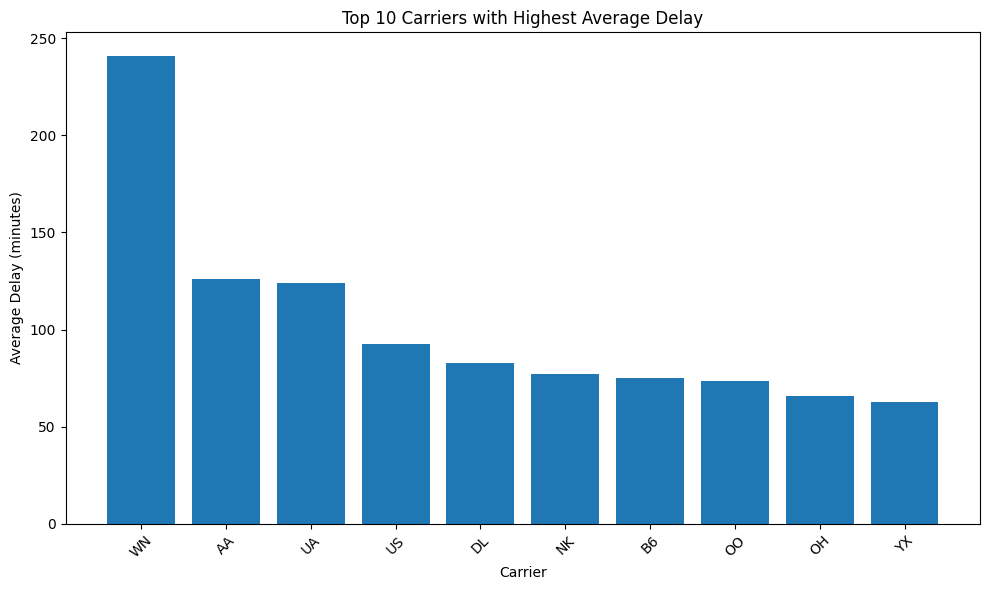

In [11]:

# Drop rows where either 'Carrier' or 'Delay' is missing
merged_df_new = merged_df.dropna(subset=['carrier', 'arr_del15'])

# Convert delay to numeric in case it's read as object
merged_df_new['arr_del15'] = pd.to_numeric(merged_df_new['arr_del15'], errors='coerce')

# Calculate average delay per carrier
avg_delay_by_carrier = merged_df_new.groupby('carrier')['arr_del15'].mean().sort_values(ascending=False).reset_index()
avg_delay_by_carrier_df = pd.DataFrame(avg_delay_by_carrier)
# Display top 10 carriers with highest average delay
print("Top 10 carriers with highest average delay per flight:")
avg_delay_by_carrier_df.head(10)

# plot the top 10
top10 = avg_delay_by_carrier.head(10)
plt.figure(figsize=(10, 6))
plt.bar(top10['carrier'], top10['arr_del15'])
plt.title('Top 10 Carriers with Highest Average Delay')
plt.xlabel('Carrier')
plt.ylabel('Average Delay (minutes)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


<Figure size 1200x600 with 0 Axes>

<Axes: xlabel='month_year'>

Text(0.5, 1.0, 'Monthly Trend of Average Arrival Delays For All Airlines')

Text(0.5, 0, 'Month-Year')

Text(0, 0.5, 'Average Delay (in minutes)')

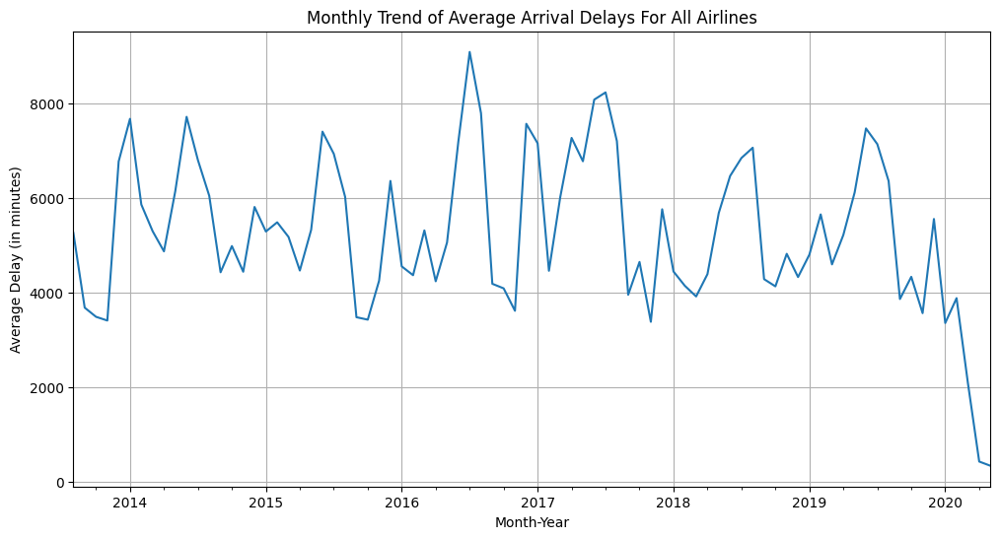

In [12]:
# Create a 'month_year' column
merged_df['month_year'] = pd.to_datetime(merged_df[['year', 'month']].assign(day=1))
monthly_delays = merged_df.groupby('month_year')['arr_delay'].mean()

# Plotting time series trends : Monthly Trend of Average Arrival Delays For All Airlines
plt.figure(figsize=(12, 6))
monthly_delays.plot()
plt.title("Monthly Trend of Average Arrival Delays For All Airlines")
plt.xlabel("Month-Year")
plt.ylabel("Average Delay (in minutes)")
plt.grid()
plt.show()

# Q2 : Do warmer months show more average delays?

Average delay per season:
   Season  weather_ct
3  Winter        2.85
1  Spring        2.08
2  Summer        3.97
0    Fall        1.60


<Figure size 800x500 with 0 Axes>

<BarContainer object of 4 artists>

Text(0.5, 1.0, 'Average Flight Delay by Season')

Text(0.5, 0, 'Season')

Text(0, 0.5, 'Average Delay (minutes)')

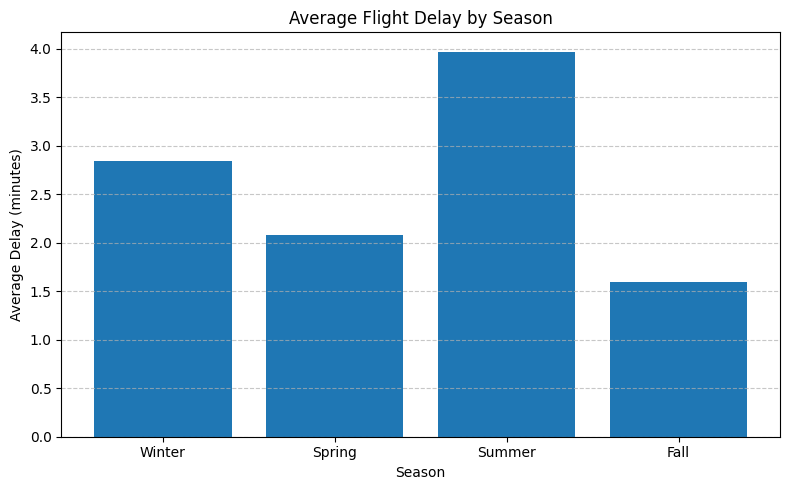

In [13]:

# Drop rows with missing values in Month or Delay
merged_df_1 = merged_df.dropna(subset=['month', 'weather_ct'])

# Ensuring types are correct
merged_df_1['month'] = pd.to_numeric(merged_df_1['month'], errors='coerce')
merged_df_1['weather_ct'] = pd.to_numeric(merged_df_1['weather_ct'], errors='coerce')

# Define a function to map months to seasons
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    elif month in [9, 10, 11]:
        return 'Fall'
    else:
        return 'Unknown'

# Apply season mapping
merged_df_1['Season'] = merged_df_1['month'].apply(get_season)

# Group by season and calculate average delay
seasonal_delay = merged_df_1.groupby('Season')['weather_ct'].mean().reset_index()

# Sort seasons for consistency
season_order = ['Winter', 'Spring', 'Summer', 'Fall']
seasonal_delay['Season'] = pd.Categorical(seasonal_delay['Season'], categories=season_order, ordered=True)
seasonal_delay = seasonal_delay.sort_values('Season')

# Display result
print("Average delay per season:")
print(seasonal_delay)

# Plot
plt.figure(figsize=(8, 5))
plt.bar(seasonal_delay['Season'], seasonal_delay['weather_ct'])
plt.title('Average Flight Delay by Season')
plt.xlabel('Season')
plt.ylabel('Average Delay (minutes)')
plt.grid(True, axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


<Figure size 1000x600 with 0 Axes>

Text(0.5, 1.0, 'Monthly Trend: Avg Temperature vs Flight Delay')

Text(0.5, 0, 'Month')

Text(0, 0.5, 'Value')

([<matplotlib.axis.XTick at 0x30183cbe0>,
 [Text(1, 0, '1'),
  Text(2, 0, '2'),
  Text(3, 0, '3'),
  Text(4, 0, '4'),
  Text(5, 0, '5'),
  Text(6, 0, '6'),
  Text(7, 0, '7'),
  Text(8, 0, '8'),
  Text(9, 0, '9'),
  Text(10, 0, '10'),
  Text(11, 0, '11'),
  Text(12, 0, '12')])

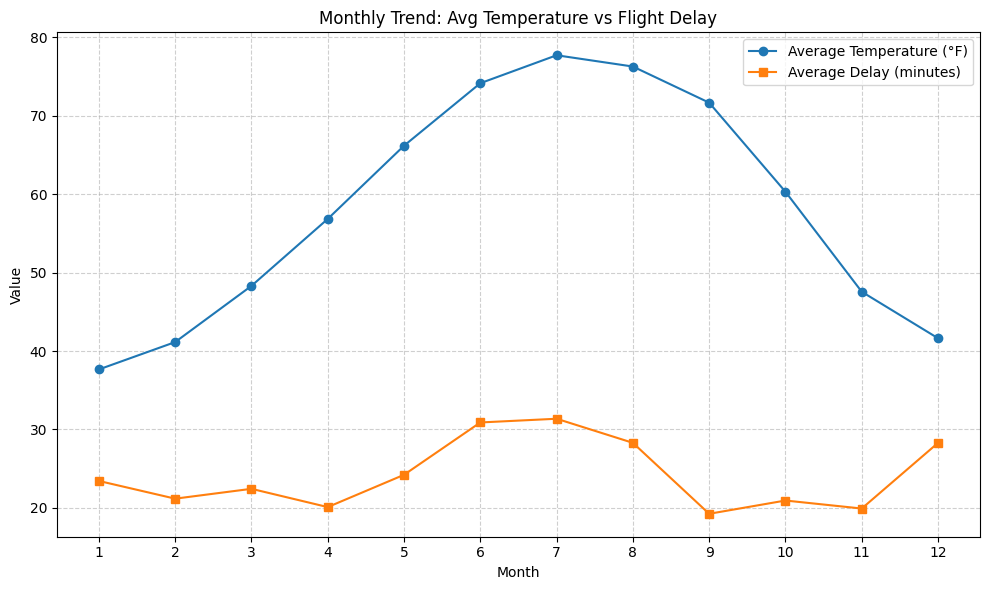

In [ ]:

# Choose relevant columns
temp_col = 'avgtemperature'
delay_col = 'carrier_ct'  # Change as needed
time_col = 'month'  # Can also use 'Date' if available

# Drop missing values
merged_df_3 = merged_df[[time_col, temp_col, delay_col]].dropna()

# Convert columns to numeric
merged_df_3[temp_col] = pd.to_numeric(merged_df_3[temp_col], errors='coerce')
merged_df_3[delay_col] = pd.to_numeric(merged_df_3[delay_col], errors='coerce')
merged_df_3[time_col] = pd.to_numeric(merged_df_3[time_col], errors='coerce')

# Drop NaNs
merged_df_3 = merged_df_3.dropna()

# Group by Month and calculate averages
monthly_avg = merged_df_3.groupby(time_col).agg({
    temp_col: 'mean',
    delay_col: 'mean'
}).reset_index()

# Sort by Month just in case
monthly_avg = monthly_avg.sort_values(by=time_col)

# Plot line graph
plt.figure(figsize=(10, 6))
plt.plot(monthly_avg[time_col], monthly_avg[temp_col], marker='o', label='Average Temperature (°F)')
plt.plot(monthly_avg[time_col], monthly_avg[delay_col], marker='s', label='Average Delay (minutes)')

plt.title('Monthly Trend: Avg Temperature vs Flight Delay')
plt.xlabel('Month')
plt.ylabel('Value')
plt.xticks(monthly_avg[time_col])  # to ensure all months are shown
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend()
plt.tight_layout()
plt.show()


<Figure size 800x500 with 0 Axes>

Text(0.5, 1.0, 'Average Flight Delay by Season')

Text(0.5, 0, 'Season')

Text(0, 0.5, 'Average Delay (minutes)')

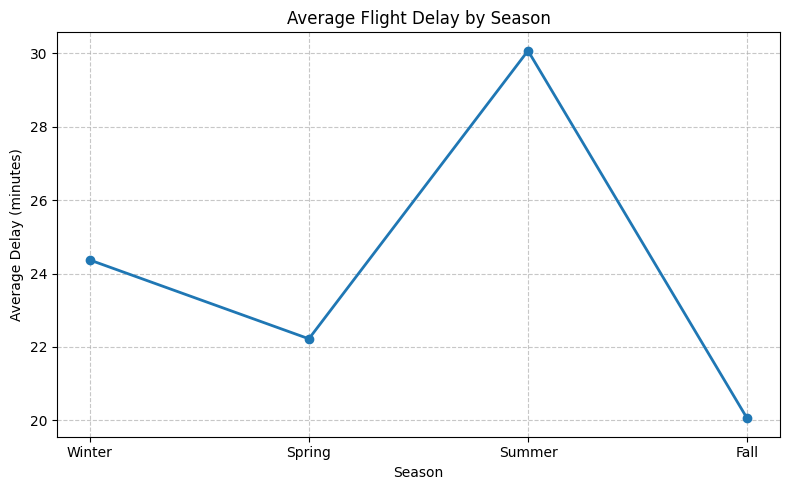

In [16]:
# Set column names as per dataset
month_col = 'month'          
delay_col = 'carrier_ct'      

# Clean and convert data
merged_df_4 = merged_df[[month_col, delay_col]].dropna()
merged_df_4[month_col] = pd.to_numeric(merged_df_4[month_col], errors='coerce')
merged_df_4[delay_col] = pd.to_numeric(merged_df_4[delay_col], errors='coerce')
merged_df_4 = merged_df_4.dropna()

# Function to map month to season
def month_to_season(month):
    if month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    elif month in [9, 10, 11]:
        return 'Fall'
    elif month in [12, 1, 2]:
        return 'Winter'

merged_df_4['Season'] = merged_df_4[month_col].apply(month_to_season)

# Group by season and calculate average delay
seasonal_delay = merged_df_4.groupby('Season')[delay_col].mean().reset_index()

# Sort season order manually
season_order = ['Winter', 'Spring', 'Summer', 'Fall']
seasonal_delay['Season'] = pd.Categorical(seasonal_delay['Season'], categories=season_order, ordered=True)
seasonal_delay = seasonal_delay.sort_values('Season')

# Plot line graph
plt.figure(figsize=(8, 5))
plt.plot(seasonal_delay['Season'], seasonal_delay[delay_col], marker='o', linestyle='-', linewidth=2)
plt.title('Average Flight Delay by Season')
plt.xlabel('Season')
plt.ylabel('Average Delay (minutes)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


# Q3 : Does temperature correlate with delay per flight?

### ❓❓❓ "Among the different types of delays (e.g., carrier, weather, arrival, late aircraft, security, NAS), which one shows the strongest correlation with average temperature?"

In [17]:
# calculate the correlation between Average Temperature and Carrier Delay
temp_col = 'avgtemperature'
delay_col_2 = 'carrier_delay'  
relationship_df = merged_df[[temp_col, delay_col_2]].dropna()
correlation = relationship_df[temp_col].corr(relationship_df[delay_col_2])
print("The correlation between Average Temperature and Carrier Delay : ", correlation)

# calculate the correlation between Average Temperature and Weather Delay
temp_col = 'avgtemperature'
delay_col_3 = 'weather_delay'  
relationship_df_2 = merged_df[[temp_col, delay_col_3]].dropna()
correlation = relationship_df_2[temp_col].corr(relationship_df_2[delay_col_3])
print("The correlation between Average Temperature and Weather Delay : ", correlation)

# calculate the correlation between Average Temperature and Arrival Delay
temp_col = 'avgtemperature'
delay_col_4 = 'arr_delay'  
relationship_df_3 = merged_df[[temp_col, delay_col_4]].dropna()
correlation = relationship_df_3[temp_col].corr(relationship_df_3[delay_col_4])
print("The correlation between Average Temperature and Arrival Delay : ", correlation)

# calculate the correlation between Average Temperature and Security Delay
temp_col = 'avgtemperature'
delay_col_6 = 'security_delay'  
relationship_df_5 = merged_df[[temp_col, delay_col_6]].dropna()
correlation = relationship_df_5[temp_col].corr(relationship_df_5[delay_col_6])
print("The correlation between Average Temperature and Security Delay : ", correlation)

# calculate the correlation between Average Temperature and NAS Delay
temp_col = 'avgtemperature'
delay_col_7 = 'nas_delay'  
relationship_df_6 = merged_df[[temp_col, delay_col_7]].dropna()
correlation = relationship_df_6[temp_col].corr(relationship_df_6[delay_col_7])
print("The correlation between Average Temperature and NAS Delay : ", correlation)

The correlation between Average Temperature and Carrier Delay :  0.0515720482487107
The correlation between Average Temperature and Weather Delay :  0.03523668169318252
The correlation between Average Temperature and Arrival Delay :  0.052702398133899694
The correlation between Average Temperature and Security Delay :  0.0300220851260505
The correlation between Average Temperature and NAS Delay :  0.03721650222050141


In [18]:
# create a dictionary to store all the correlation value
correlations = {
    "Carrier Delay": 0.051572048248709985,
    "Weather Delay": 0.03523668169317899,
    "Arrival Delay": 0.05270239813389995,
    "Security Delay": 0.030022085126049217,
    "NAS Delay": 0.037216502220500325
}

# find the maximum correlation
max_corr_type = max(correlations, key=correlations.get)
max_corr_value = correlations[max_corr_type]


print(f"The strongest correlation with Average Temperature is: {max_corr_type} ({max_corr_value:.4f})")


The strongest correlation with Average Temperature is: Arrival Delay (0.0527)



## Constraints and Caveats

- **Data Completeness**: Some flight records may have missing values, especially in weather-related or delay-specific fields.
- **Data Accuracy**: Delay reasons may overlap or be misclassified, especially when multiple issues contribute to a single delay.
- **Seasonal Bias**: The dataset may not fully capture all months or seasons equally, leading to biased seasonal interpretations.
- **Granularity**: Aggregation at the city level may obscure local airport-specific patterns.

## Conclusion

In this analysis, we investigated key factors influencing flight delays across U.S. cities. Our findings revealed that:

- Weather delays show a moderate correlation with temperature, especially in extreme conditions.
- Certain airline carriers consistently experience higher average delays, signaling potential efficiency issues.
- Seasonal trends indicate that warmer months tend to have slightly increased delays, possibly due to heat-related operational disruptions.
- Among all delay types, late aircraft and carrier-related issues emerged as the most significant contributors to total delay times.

These insights not only help in understanding patterns behind flight disruptions but also provide actionable recommendations for airlines and airport authorities to optimize performance and passenger experience.

## Future Use of Insights

- **Airline Optimization**: Carriers can use this analysis to identify high-delay routes or cities and adjust schedules accordingly.
- **Infrastructure Planning**: Airports can leverage findings to allocate resources during high-delay seasons.
- **Policy Recommendations**: Regulatory bodies can use this to propose data-backed changes to minimize national delays.
- **Passenger Awareness**: Insights can be shared with travelers for better trip planning during peak months or in high-delay cities.
